In [93]:
import pandas as pd
import numpy as np
df = pd.read_csv("https://raw.githubusercontent.com/campusx-team/Text-Datasets/refs/heads/main/Reddit_Data.csv")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37249 entries, 0 to 37248
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   clean_comment  37149 non-null  object
 1   category       37249 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 582.1+ KB


In [94]:
pd.set_option('display.width', 1000)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
np.set_printoptions(threshold=np.inf)

## Data Processing and EDA

In [116]:
# Clean comment column ahs null values - Droping them

df.dropna(subset=['clean_comment'], inplace=True)
data = df.copy()

In [57]:
# Getting list of unique characters - to get idea what different characters are there in comments
# It will make it easier to clean them and analyse

chars = pd.Series(list(df.clean_comment.str.cat()))
unique_chars = chars.unique()
unique_chars.sort()

In [58]:
print("No of unique charaters: ", len(unique_chars))

np.array2string(unique_chars)

No of unique charaters:  1379


"['\\t' '\\n' ' ' '0' '1' '2' '3' '4' '5' '6' '7' '8' '9' '@' '\\\\' 'a' 'b'\n 'c' 'd' 'e' 'f' 'g' 'h' 'i' 'j' 'k' 'l' 'm' 'n' 'o' 'p' 'q' 'r' 's' 't'\n 'u' 'v' 'w' 'x' 'y' 'z' '\\xa0' '¢' '£' '§' '¨' '©' '«' '\\xad' '®' '¯' '°'\n '±' '´' '·' '¸' '»' '¿' '×' 'à' 'á' 'ã' 'ä' 'å' 'ç' 'è' 'é' 'ê' 'ë' 'ì'\n 'í' 'î' 'ï' 'ð' 'ñ' 'ò' 'ó' 'ô' 'õ' 'ö' '÷' 'ù' 'ú' 'ü' 'ā' 'ą' 'č' 'ď'\n 'ē' 'ė' 'ę' 'ī' 'į' 'ō' 'œ' 'ś' 'š' 'ũ' 'ū' 'ų' 'ž' 'ɔ' 'ɕ' 'ə' 'ɛ' 'ɣ'\n 'ɥ' 'ɲ' 'ɾ' 'ʁ' 'ʃ' 'ʎ' 'ʒ' 'ʔ' 'ʰ' 'ʲ' 'ʷ' 'ː' 'ˠ' '̄' '̥' '̪' '̵' '̿'\n '͇' '͜' '͞' '͡' 'χ' 'а' 'б' 'в' 'д' 'и' 'й' 'к' 'л' 'м' 'н' 'о' 'п' 'р'\n 'с' 'т' 'у' 'х' 'ц' 'ч' 'ы' 'ь' 'ю' 'ө' '֑' '֖' '֣' '֥' 'ְ' 'ֲ' 'ִ' 'ֶ'\n 'ַ' 'ָ' 'ֹ' 'ּ' 'ֽ' '׃' '؟' 'آ' 'ئ' 'ا' 'ب' 'ة' 'ت' 'ج' 'ح' 'خ' 'د' 'ر'\n 'ز' 'س' 'ش' 'ص' 'ض' 'ط' 'ع' 'ف' 'ق' 'ك' 'ل' 'م' 'ن' 'و' 'ي' 'ً' 'ٍ' 'َ'\n 'ُ' 'ِ' 'ّ' 'ْ' 'پ' 'چ' 'ڈ' 'ڑ' 'ک' 'گ' 'ں' 'ھ' 'ہ' 'ی' 'ے' '۔' 'ँ' 'ं'\n 'ः' 'अ' 'आ' 'इ' 'ई' 'उ' 'ऊ' 'ए' 'क' 'ख' 'ग' 'घ' 'च' 'ज' 'झ' 'ट' 'ड' 'ण'\n 'त' 'थ' 'द' 'ध' 'न' 'प' 'ब' '

In [59]:
unique_chars_counts = pd.Series(chars).value_counts()
unique_chars_counts

      1097531
e      667025
t      491655
a      481442
i      401612
n      388677
o      380205
s      355521
r      331588
h      296971
l      250275
d      222132
u      170483
c      167950
m      155676
p      135226
g      133007
y      115500
w      110622
b       88246
f       78925
v       66047
k       62588
j       22924
x        9081
0        8477
z        5725
q        5141
1        4847
2        4640
’        2314
9        1775
5        1631
3        1617
4        1573
6        1403
7        1291
8        1199
\n       1056
ा         772
“         695
”         665
े         519
\         476
ी         394
@         366
ं         325
ो         305
्         285
ė         280
ि         232
š         227
ų         211
്         188
️         180
ž         171
‘         169
—         168
ै         163
±         155
–         136
ą         135
ु         127
，         126
à         114
ū         110
的         109
č         102
।          95
क          91
ി          90
…     

* There are so many characters which has very less counts.
* Hindi characters are there - will check words count then decide wether to have this or not. 

In [60]:
import re

def remove_non_english_hindi_and_extra_spaces(text):
    # Retain English (a-zA-Z), apostrophe ('), Devanagari (\u0900-\u097F), and spaces
    text = re.sub(r"[^a-zA-Z\u0900-\u097F\s']", '', text)
    
    # Replace multiple spaces with a single space
    text = re.sub(r'\s{2,}', ' ', text).strip()
    
    return text

# Example usage
texts = df.clean_comment.str.cat(sep=' ')
clean_text = remove_non_english_hindi_and_extra_spaces(texts)
print(clean_text)

family mormon have never tried explain them they still stare puzzled from time time like some kind strange creature nonetheless they have come admire for the patience calmness equanimity acceptance and compassion have developed all the things buddhism teaches buddhism has very much lot compatible with christianity especially considering that sin and suffering are almost the same thing suffering caused wanting things shouldn want going about getting things the wrong way christian this would mean wanting things that don coincide with god will and wanting things that coincide but without the aid jesus buddhism could also seen proof god all mighty will and omnipotence certainly christians are lucky have one such christ there side but what about everyone else well many christians believe god grace salvation and buddhism god way showing grace upon others would also help study the things jesus said and see how buddha has made similar claims such rich man getting into heaven joke basically adv

In [61]:
# Look at characters counts of cleaned text

unique_chars_counts = pd.Series(list(clean_text)).value_counts()
unique_chars_counts = unique_chars_counts.reset_index()

In [64]:
unique_chars_counts

,index,count
0,,1082878
1,e,667025
2,t,491655
3,a,481442
4,i,401612
5,n,388677
6,o,380205
7,s,355521
8,r,331588
9,h,296971


In [65]:
unique_chars_counts.iloc[[77, 72, 40]]['index'].to_list()

['\u2008', '\u2009', '\xa0']

In [66]:
characters_to_remove = ['\u2008', '\u2009', '\xa0']

def remove_unicode_chars(text, chars_to_remove):
    """Remove specific Unicode characters from the text."""
    for char in chars_to_remove:
        text = text.replace(char, '')
    return text

clean_text = remove_unicode_chars(clean_text, characters_to_remove)

unique_chars_counts = pd.Series(list(clean_text)).value_counts()
unique_chars_counts = unique_chars_counts.reset_index()
print(clean_text)

family mormon have never tried explain them they still stare puzzled from time time like some kind strange creature nonetheless they have come admire for the patience calmness equanimity acceptance and compassion have developed all the things buddhism teaches buddhism has very much lot compatible with christianity especially considering that sin and suffering are almost the same thing suffering caused wanting things shouldn want going about getting things the wrong way christian this would mean wanting things that don coincide with god will and wanting things that coincide but without the aid jesus buddhism could also seen proof god all mighty will and omnipotence certainly christians are lucky have one such christ there side but what about everyone else well many christians believe god grace salvation and buddhism god way showing grace upon others would also help study the things jesus said and see how buddha has made similar claims such rich man getting into heaven joke basically adv

In [69]:
words = clean_text.split()

# Remove all words with less than 3 characters
filtered_words = [word for word in words if len(word) >= 3]

# Get the length of the filtered word list
len(filtered_words)


1079957

In [70]:
sorted(filtered_words)

['aaa',
 'aaa',
 'aaa',
 'aaaa',
 'aaaaaaaa',
 'aaaaand',
 'aaaaawwww',
 'aaaah',
 'aaaand',
 'aaaand',
 'aaaand',
 'aaab',
 'aaadhar',
 'aaah',
 'aaah',
 'aaam',
 'aaannnddd',
 'aaap',
 'aaaya',
 'aaazamgarh',
 'aaazamgarh',
 'aab',
 'aab',
 'aabaasa',
 'aac',
 'aac',
 'aac',
 'aac',
 'aac',
 'aadar',
 'aadarsh',
 'aadat',
 'aadat',
 'aadat',
 'aadesh',
 'aadesh',
 'aadh',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',
 'aadhaar',

In [73]:
import re

def limit_repeated_a(text):
    # Replace sequences of 'aaa' or more with 'aa'
    text = re.sub(r'a{3,}', 'aa', text)
    return text

# Example usage
cleaned_words = [limit_repeated_a(word) for word in filtered_words]

print(len(cleaned_words))


1079957


In [74]:
from collections import Counter
word_counts = Counter(words)
word_counts.most_common(10)

[('the', 57754),
 ('and', 28956),
 ('that', 15462),
 ('this', 13501),
 ('for', 12992),
 ('you', 11807),
 ('are', 10572),
 ('they', 8710),
 ('not', 8703),
 ('have', 8387)]

#### Combininge all text processing into one

In [97]:
import re
import nltk
import string
import numpy as np
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from textblob import TextBlob  # For spelling correction
import emoji

# Download required NLTK resources
nltk.download('wordnet')
nltk.download('stopwords')

# Precompiled stopwords set for faster lookups
stop_words = set(stopwords.words("english"))
lemmatizer = WordNetLemmatizer()

# Dictionary for contractions
contractions_dict = {
    "can't": "cannot",
    "won't": "will not",
    "I'm": "I am",
    "it's": "it is",
    "don't": "do not",
    "you're": "you are",
    "he's": "he is",
    "she's": "she is",
    "they're": "they are",
    "we're": "we are",
    "I've": "I have",
    "you've": "you have",
    "wouldn't": "would not",
    "shouldn't": "should not",
    "couldn't": "could not",
    # Add more as needed
}

def expand_contractions(text):
    """Replace contractions with their full forms."""
    for contraction, full_form in contractions_dict.items():
        text = re.sub(rf'\b{contraction}\b', full_form, text)
    return text

def translate_emojis(text):
    """Detect and replace emojis with their corresponding textual descriptions."""
    text =  emoji.demojize(text, delimiters=(" ", " "))
    return text.replace('_', ' ')

def remove_unwanted_characters(text):
    """Remove all characters except English, Devanagari, apostrophes, and spaces."""
    return re.sub(r"[^\u0900-\u097Fa-zA-Z\s']", '', text)

def remove_newlines(text):
    """Replace newlines with spaces."""
    return text.replace('\n', ' ')

def compress_spaces(text):
    """Replace multiple spaces with a single space."""
    return re.sub(r'\s+', ' ', text).strip()

def limit_repeated_characters(text):
    """Limit repeated characters to a maximum of two."""
    return re.sub(r'(.)\1{2,}', r'\1\1', text)

def lemmatization(text):
    """Lemmatize the text."""
    return " ".join([lemmatizer.lemmatize(word) for word in text.split()])

def remove_stop_words(text):
    """Remove stop words from the text."""
    return " ".join([word for word in text.split() if word not in stop_words])


def removing_numbers(text):
    """Remove numbers from the text."""
    return ''.join(char for char in text if not char.isdigit())

def lower_case(text):
    """Convert text to lower case."""
    return text.lower()

def removing_punctuations(text):
    """Remove punctuations from the text."""
    return re.sub(r'[{}]+'.format(re.escape(string.punctuation)), ' ', text).strip()

def removing_urls(text):
    """Remove URLs from the text."""
    return re.sub(r'https?://\S+|www\.\S+', '', text)

def spelling_correction(text):
    """Perform spelling correction on English words only, skipping valid words."""
    text = limit_repeated_characters(text)
    corrected_text = []
    for word in text.split():
        # Skip spell correction for words in the valid_words set
        if word.lower() in valid_words:
            corrected_text.append(word)
        else:
            if not re.search(r'[\u0900-\u097F]', word):
                # Correct English words only
                corrected_word = str(TextBlob(word).correct())
                corrected_text.append(corrected_word)
            else:
                corrected_text.append(word)
    return ' '.join(corrected_text)

def process_text(df):
    """Normalize the text data, including emoji translation."""
    df['content'] = (df['clean_comment']
                     .apply(lower_case)  # Step 1: Convert to lower case
                     .apply(translate_emojis)  # Step 2: Translate emojis to text
                     .apply(expand_contractions)  # Step 3: Replace contractions
                     .apply(remove_unwanted_characters)  # Step 4: Remove unwanted characters
                     .apply(removing_numbers)  # Step 5: Remove numbers
                     .apply(removing_punctuations)  # Step 6: Remove punctuation (apostrophes kept)
                     .apply(removing_urls)  # Step 7: Remove URLs
                     .apply(remove_newlines)  # Step 8: Remove newlines
                     .apply(limit_repeated_characters)  # Step 9: Limit repeated characters
                     .apply(remove_stop_words)  # Step 10: Remove stop words
                     .apply(lemmatization)  # Step 11: Lemmatization
                     .apply(spelling_correction)  # Step 12: Spell correction for English
                     .apply(compress_spaces))  # Step 13: Ensure only single space
    return df

valid_words = []

# Transform the data
train_processed_data = process_text(data)

print(train_processed_data['content'])


[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\suman\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\suman\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


0        family mormon never tried explain still stare ...
1        buddhist much lot compatible christianity espe...
2        seriously say thing first get complex explain ...
3        learned want teach different focus goal wrappi...
4        benefit may want read living buddha living chr...
5        sit together watch simpson episode lisa become...
6        been discovered zen meditation diagnosed bed h...
7                                       jesus zen meet jew
8        two variety christian dramatic dwell word cons...
9        dont worry trying explain meditate regularly t...
10       recently told family buddhist live bible belt ...
11                 unto others would unto would good start
12       first understand anyway control react always f...
13       recently heard similar question person asked i...
14       different time different culture point trying ...
15                          evil include lady pain chucked
16       campaign two sun one poor shamedan poor god kn.

In [98]:
train_processed_data.to_csv('processed_data.csv', index=False)

In [99]:
train_processed_data.head()

,clean_comment,category,content
0,family mormon have never tried explain them t...,1,family mormon never tried explain still stare ...
1,buddhism has very much lot compatible with chr...,1,buddhist much lot compatible christianity espe...
2,seriously don say thing first all they won get...,-1,seriously say thing first get complex explain ...
3,what you have learned yours and only yours wha...,0,learned want teach different focus goal wrappi...
4,for your own benefit you may want read living ...,1,benefit may want read living buddha living chr...


In [123]:
train_processed_data = pd.read_csv('processed_data.csv')
train_processed_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37149 entries, 0 to 37148
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   clean_comment  37149 non-null  object
 1   category       37149 non-null  int64 
 2   content        36886 non-null  object
dtypes: int64(1), object(2)
memory usage: 870.8+ KB


* After Cleaning - we there some samples that has null values in content (new column)

In [124]:

train_processed_data.dropna(subset='content', inplace=True)

## EDA

In [125]:
train_processed_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 36886 entries, 0 to 37148
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   clean_comment  36886 non-null  object
 1   category       36886 non-null  int64 
 2   content        36886 non-null  object
dtypes: int64(1), object(2)
memory usage: 1.1+ MB


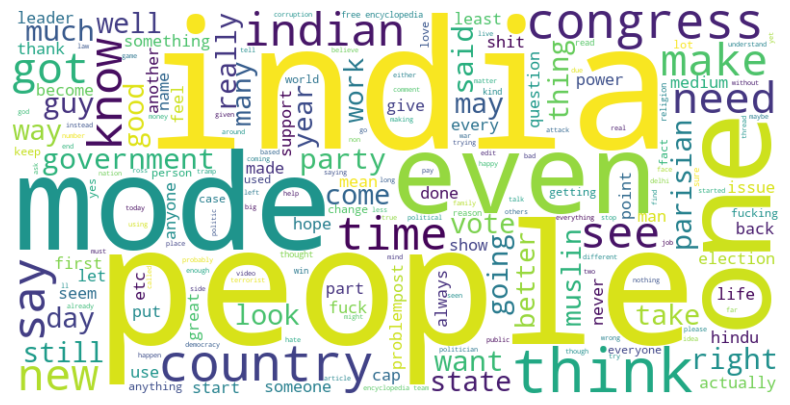

In [126]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def plot_word_cloud(text):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(text))
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

plot_word_cloud(train_processed_data['content'])

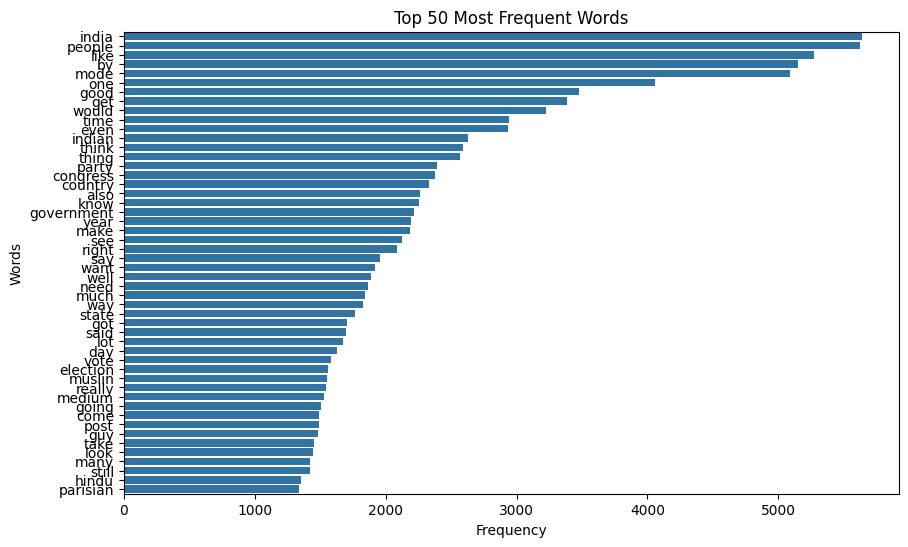

In [127]:
import seaborn as sns
import matplotlib.pyplot as plt
from collections import Counter

def plot_top_n_words(df, n=20):
    """Plot the top N most frequent words in the dataset."""
    # Flatten all words in the content column
    words = ' '.join(df['content']).split()
    
    # Get the top N most common words
    counter = Counter(words)
    most_common_words = counter.most_common(n)
    
    # Split the words and their counts for plotting
    words, counts = zip(*most_common_words)
    
    # Plot the top N words
    plt.figure(figsize=(10, 6))
    sns.barplot(x=list(counts), y=list(words))
    plt.title(f'Top {n} Most Frequent Words')
    plt.xlabel('Frequency')
    plt.ylabel('Words')
    plt.show()

# Example usage
plot_top_n_words(train_processed_data, n=50)


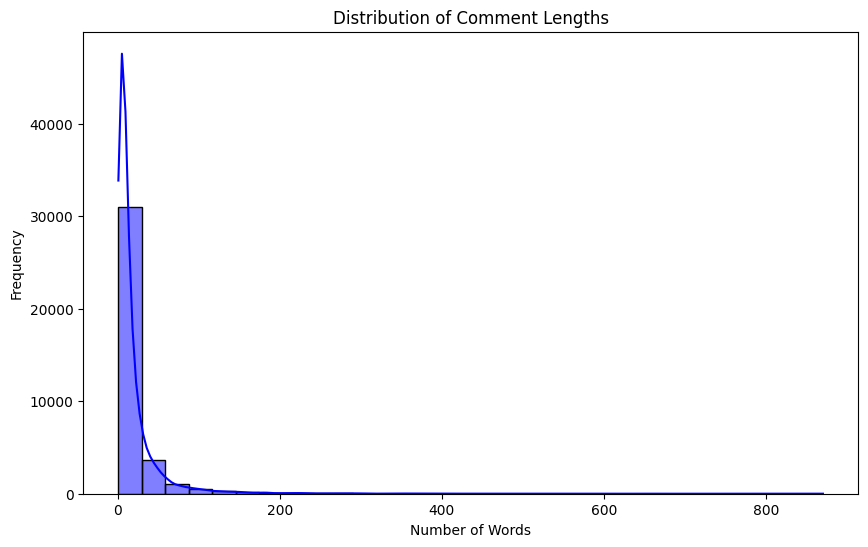

In [130]:
train_processed_data['comment_length'] = train_processed_data['content'].apply(lambda x: len(x.split()))

plt.figure(figsize=(10, 6))
sns.histplot(train_processed_data['comment_length'], kde=True, bins=30, color='blue')
plt.title('Distribution of Comment Lengths')
plt.xlabel('Number of Words')
plt.ylabel('Frequency')
plt.show()


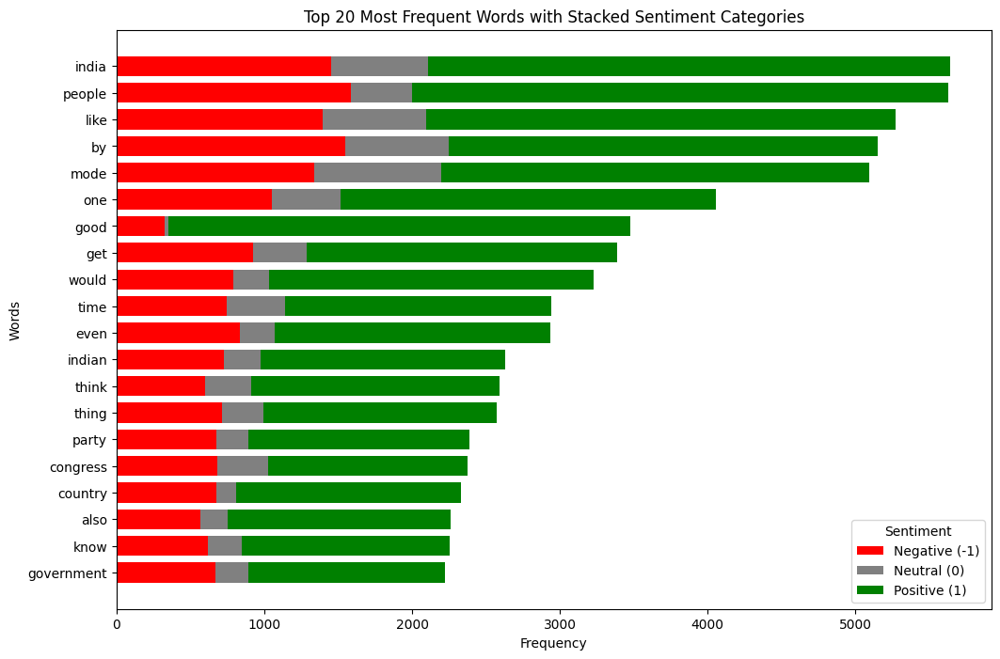

In [134]:
import seaborn as sns
import matplotlib.pyplot as plt
from collections import Counter
import pandas as pd

def plot_top_n_words_by_category(df, n=20, start=0):
    """Plot the top N most frequent words in the dataset with stacked hue based on sentiment category."""
    # Flatten all words in the content column and count their occurrences by category
    word_category_counts = {}

    for idx, row in df.iterrows():
        words = row['content'].split()
        category = row['category']  # Assuming 'category' column exists for -1, 0, 1 labels

        for word in words:
            if word not in word_category_counts:
                word_category_counts[word] = { -1: 0, 0: 0, 1: 0 }  # Initialize counts for each sentiment category
            
            # Increment the count for the corresponding sentiment category
            word_category_counts[word][category] += 1

    # Get total counts across all categories for each word
    total_word_counts = {word: sum(counts.values()) for word, counts in word_category_counts.items()}

    # Get the top N most frequent words across all categories
    most_common_words = sorted(total_word_counts.items(), key=lambda x: x[1], reverse=True)[start:start+n]
    top_words = [word for word, _ in most_common_words]

    # Prepare data for plotting
    word_labels = top_words
    negative_counts = [word_category_counts[word][-1] for word in top_words]
    neutral_counts = [word_category_counts[word][0] for word in top_words]
    positive_counts = [word_category_counts[word][1] for word in top_words]

    # Plot the stacked bar chart
    plt.figure(figsize=(12, 8))
    bar_width = 0.75
    
    # Plot negative, neutral, and positive counts in a stacked manner
    plt.barh(word_labels, negative_counts, color='red', label='Negative (-1)', height=bar_width)
    plt.barh(word_labels, neutral_counts, left=negative_counts, color='gray', label='Neutral (0)', height=bar_width)
    plt.barh(word_labels, positive_counts, left=[i+j for i,j in zip(negative_counts, neutral_counts)], color='green', label='Positive (1)', height=bar_width)

    plt.xlabel('Frequency')
    plt.ylabel('Words')
    plt.title(f'Top {n} Most Frequent Words with Stacked Sentiment Categories')
    plt.legend(title='Sentiment', loc='lower right')
    plt.gca().invert_yaxis()  # Invert y-axis to show the highest frequency at the top
    plt.show()



plot_top_n_words_by_category(train_processed_data, n=20)


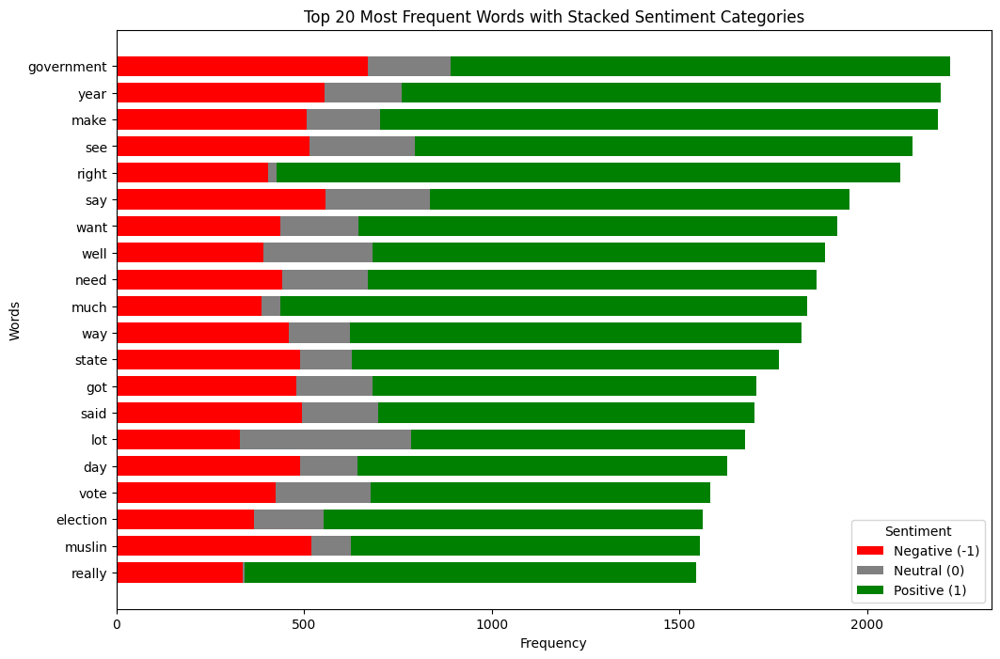

In [136]:
plot_top_n_words_by_category(train_processed_data, n=20, start=19)

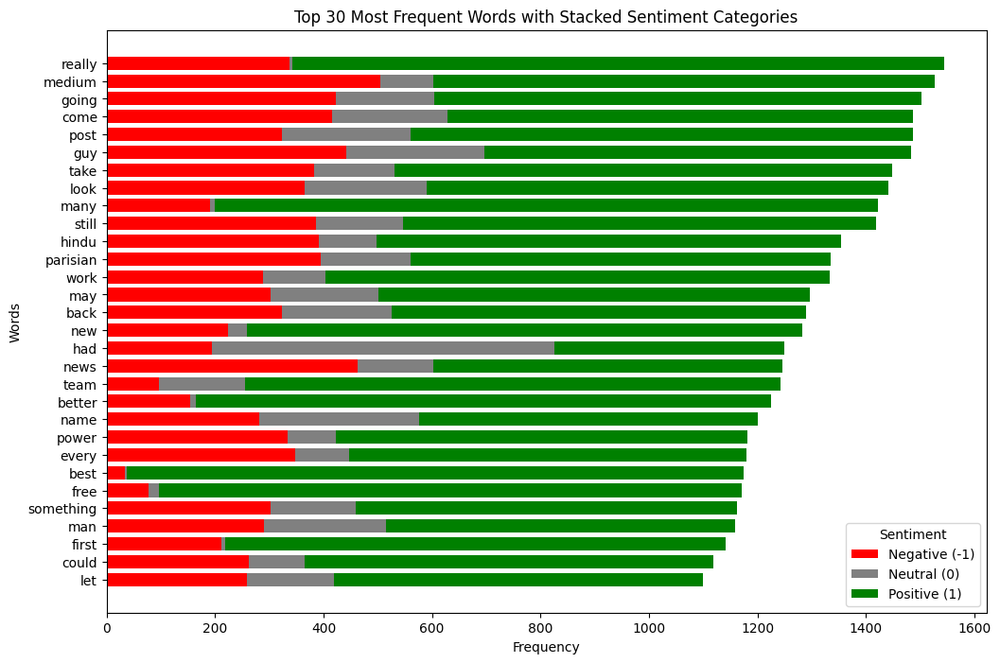

In [137]:
plot_top_n_words_by_category(train_processed_data, n=30, start=38)

In [129]:
train_processed_data[train_processed_data['comment_length']<=3]

,clean_comment,category,content,comment_length
18,zarus,0,varus,1
46,nam indeed,0,am indeed,2
47,jbdbx28pxga,0,jbdbxpxga,1
71,27s law headlines,0,law headline,2
92,dry state why,-1,dry state,2
94,questions about garba and uttrayan,0,question garbs uttrayan,3
103,does baby have the buddha nature,0,baby buddha nature,3
105,need modditor,0,need monitor,2
112,ozutcxknmzg,0,ozutcxknmzg,1
114,too much attention,1,much attention,2


* Spelling correction is corrceting wee for english words but for Hinglish words - correction changes the meaning.
* Words like garba is changed to grab

In [144]:
import emoji


def translate_emojis(text):
    """Detect and replace emojis with their corresponding textual descriptions."""
    text =  emoji.demojize(text, delimiters=(" ", " "))
    return text.replace('_', ' ')


def process_text_with_emojis(df):
    """Normalize the text data, including emoji translation."""
    df['content'] = (df['clean_comment']
                     .apply(translate_emojis)  # Translate emojis to text
    )
    return df

# Example usage
temp_data = pd.DataFrame({
    'clean_comment': [
        "I love this movie ❤️",
        "The film was okay 😕 but could be better 😎",
        "Greattttt performance! 👏👏👏"
    ]
})

temp_processed_data = process_text_with_emojis(temp_data)

# View the processed data
print(temp_processed_data['content'])

0                        I love this movie  red heart 
1    The film was okay  confused face  but could be...
2    Greattttt performance!  clapping hands  clappi...
Name: content, dtype: object


* Have updated the notebook where we did all different pre-processing to translate emojis too.
* Re-runnig will have emojis translations

In [146]:
import emoji
import pandas as pd
import re

# For just extracting emojis text

def extract_emoji(text):
    """Extract emojis from text and return their descriptions."""
    # Find all emojis in the text
    emoji_list = emoji.distinct_emoji_list(text)
    # Translate emojis to their corresponding descriptions
    emoji_descriptions = [emoji.demojize(em, delimiters=(" ", " ")) for em in emoji_list]
    return ' '.join(emoji_descriptions)



0                                        red_heart 
1     confused_face   smiling_face_with_sunglasses 
2                                   clapping_hands 
Name: content, dtype: object


In [20]:
from sklearn.model_selection import train_test_split

train_data, test_data = train_test_split(train_processed_data, test_size=.2, stratify=train_processed_data['category'], random_state=42)
train_data.info()


<class 'pandas.core.frame.DataFrame'>
Index: 29719 entries, 5364 to 23711
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   clean_comment  29719 non-null  object
 1   category       29719 non-null  int64 
 2   content        29719 non-null  object
dtypes: int64(1), object(2)
memory usage: 928.7+ KB
